# Complex plot of coefficients for paper method

Here we plot the coefficients for the radiation modes found by the paper method and investigate the zeros of this plot.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from slab import SlabExact
from fiberamp.fiber.microstruct.bragg import plotlogf
from scipy.optimize import newton
%matplotlib widget

In [2]:
A = SlabExact(ns=[1.4, 1.5, 1.4], ts=[1e-6, 1e-6, 1e-6], wl=.9e-6,
              symmetric=True) # Need symmetric interfaces for properties to hold.

Define function giving paper coefficients as function of Z in complex plane

In [3]:
def coeffs_paper(Z, sign='1'):
    M1 = A.transmission_matrix_Z(Z)
    detM = (M1[..., 0, 0] * M1[..., 1, 1]
            - M1[..., 0, 1] * M1[..., 1, 0])
    frac = (-M1[..., 1, 0] * detM) / \
        (M1[..., 0, 1])
    
    b = int(sign) * np.sqrt(frac, dtype=complex)
    r1 = -M1[..., 1, 0] / M1[..., 1, 1]
    t2 = 1 / (detM * M1[..., 1, 1])
    C = 1 / np.sqrt(r1 + b * t2, dtype=complex)
    return C

def detM(Z, sign='1'):
    M1 = A.transmission_matrix_Z(Z)
    return (M1[..., 0, 0] * M1[..., 1, 1] - M1[..., 0, 1] * M1[..., 1, 0])

def M1(Z):
    M1 = A.transmission_matrix_Z(Z)
    return M1[..., 0, 0]

def M2(Z):
    M1 = A.transmission_matrix_Z(Z)
    return M1[..., 1, 1]

def M1M2(Z):
    M1 = A.transmission_matrix_Z(Z)
    return M1[..., 0, 0] * M1[..., 1, 1]

def M2_div_M1(Z):
    M1 = A.transmission_matrix_Z(Z)
    return M1[..., 1, 1] / M1[..., 0, 0]

def product(Z):
    return coeffs_paper(Z, sign='1') * coeffs_paper(Z, sign='-1')

Even mode coefficient plot:

In [32]:
coeffs_paper(10+5j)

(0.4397976536445504+0.2802163399237921j)

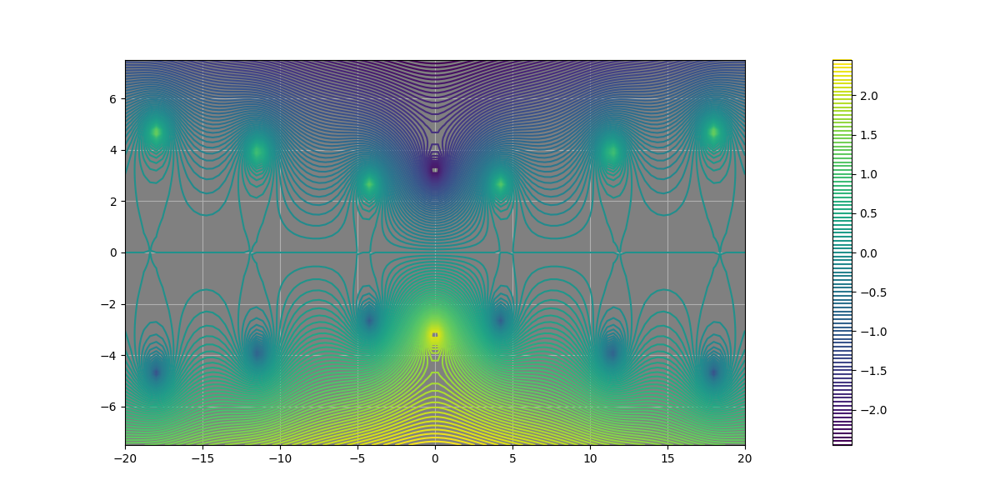

In [36]:
plotlogf(coeffs_paper, -20, 20, -7.5, 7.5,
        iref=100, rref=100, levels=100)

Odd mode coefficient plot:

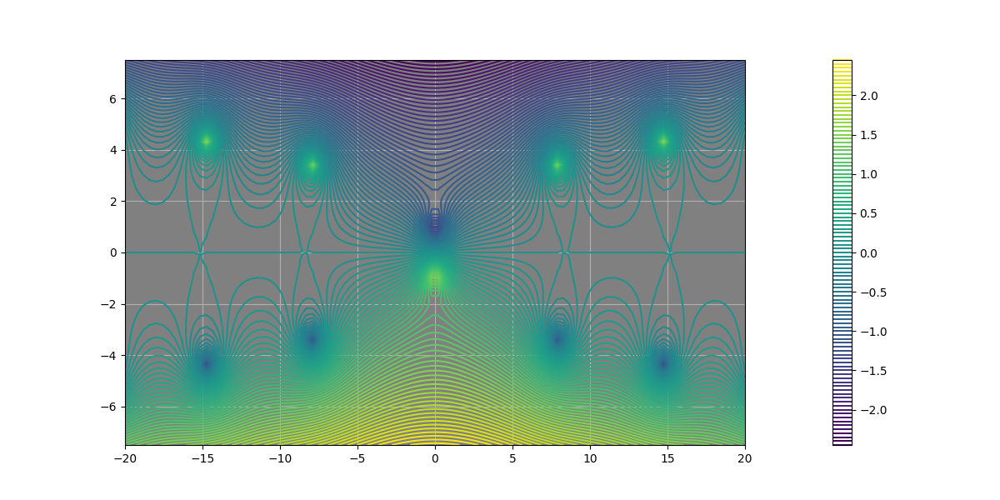

In [37]:
plotlogf(coeffs_paper, -20, 20, -7.5, 7.5, '-1',
        iref=100, rref=100, levels=100)

Product of even and odd coefficients:

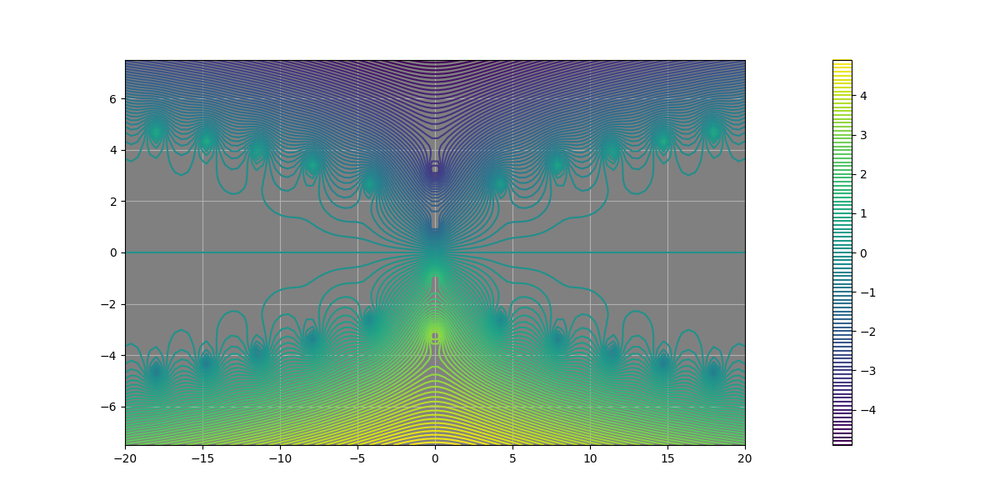

In [38]:
plotlogf(product, -20, 20, -7.5, 7.5,
        iref=100, rref=100, levels=100)

Product of M11 and M22:

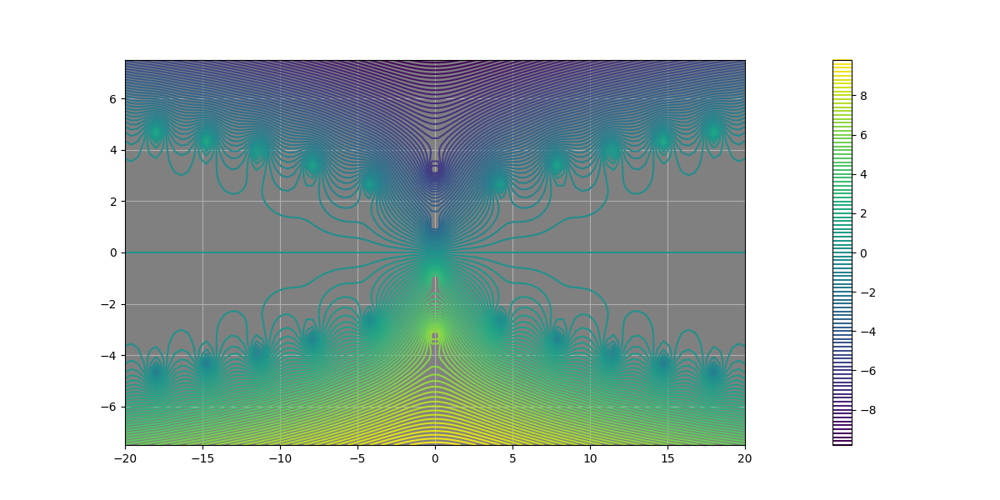

In [39]:
plotlogf(M2_div_M1, -20, 20, -7.5, 7.5,
        iref=100, rref=100, levels=100)

It appears that the even/odd modes split up the zeros of the eigenequation.  This makes sense as the eigenequation has zeros for both even and odd guided modes, so that carries over to the extension to the complex plane.

Also, it seems that there are poles in the upper part of the complex plane and zeros in the bottom part.  This suggests M11 appears in the denominator of the coefficients (as we know is true from the paper's derivation), since M11 has zeros in that part of $\mathbb C$.  The zeros in the bottom part suggest the coefficients have a factor of M11.conjugate (= M22) in the numerator, which isn't immediately clear from the derivation in the paper.

Plot of guided mode eigenvalue equation:

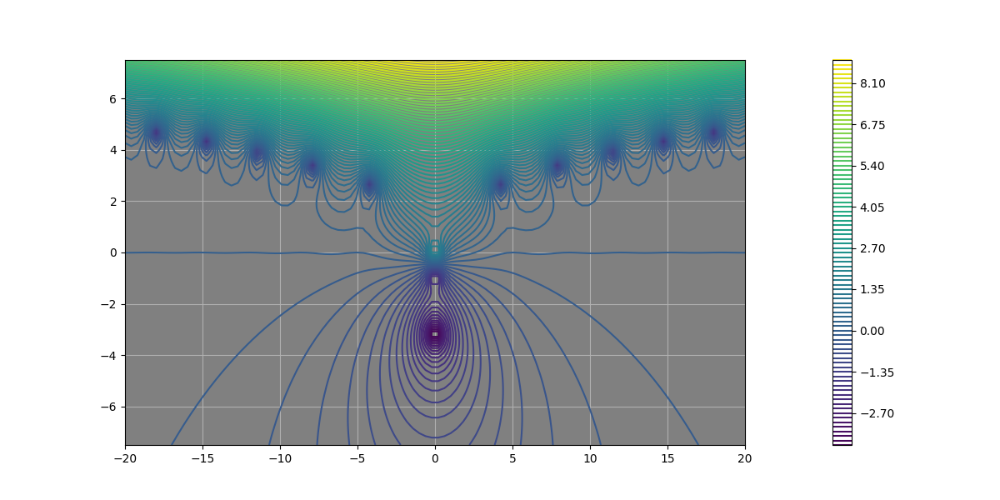

In [40]:
plotlogf(M1, -20, 20, -7.5, 7.5,
        iref=100, rref=100, levels=100)

Canceling product of even and odd mode coefficients from M11*M22 appears to leave copies of M1 in numerator to give zeros:

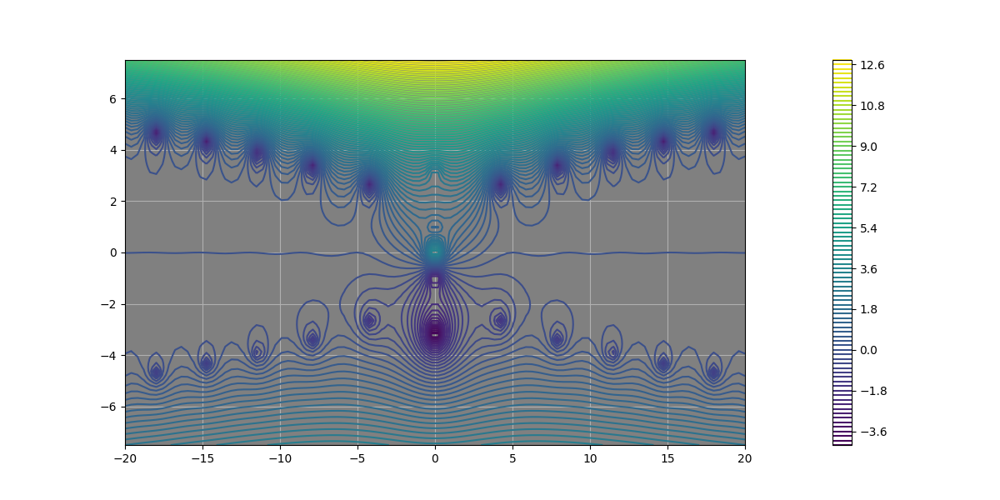

In [41]:
plotlogf(lambda Z:  M1M2(Z) / product(Z), -20, 20, -7.5, 7.5,
        iref=100, rref=100, levels=100)

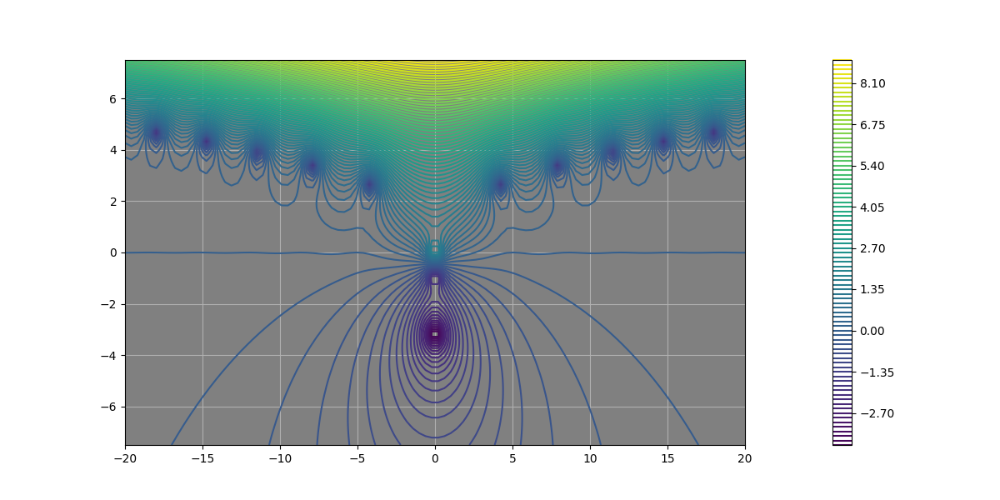

In [42]:
plotlogf(M1, -20, 20, -7.5, 7.5,
        iref=100, rref=100, levels=100)

If we divide by M11**2, we get constant magnitude:

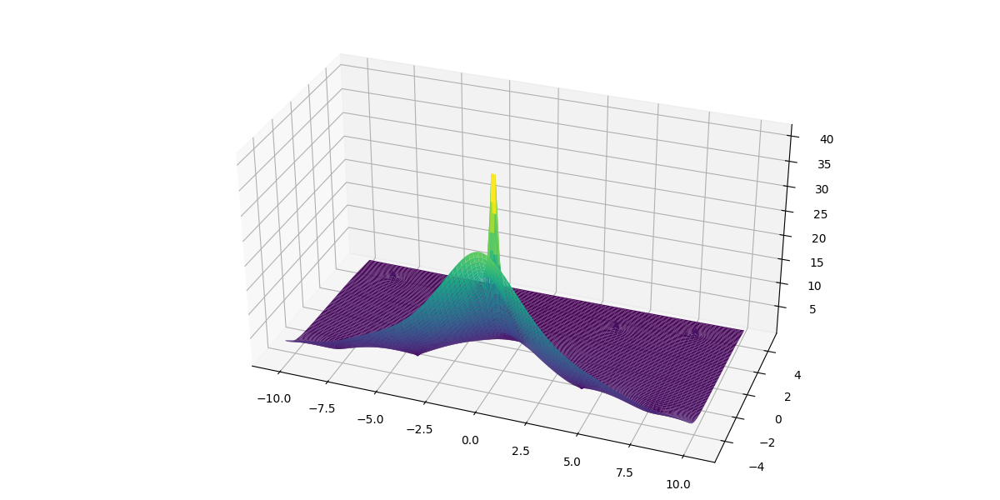

In [46]:
plotlogf(lambda Z:  M1M2(Z) / (product(Z)*M1(Z)**2), -10, 10, -5, 5,
         iref=100, rref=100, levels=100, log_off=True, colorbar=False,
         three_D=True, elev=30, azim=-70, cstride=1, rstride=1, axis_off=False)

Taking a look at this numerically and it seems to hold

In [12]:
constant = lambda Z:  M1M2(Z) / (product(Z)*M1(Z)**2)

In [13]:
np.abs(constant(2-1j)), np.abs(constant(100+1j))

(0.9999999999999993, 1.0000000000000002)

In [14]:
x, y = np.linspace(-10, 10, 100), np.linspace(-10, 10, 100)

X, Y = np.meshgrid(x,y)
Zs = X + 1j * Y

In [15]:
np.abs(constant(Zs))

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]])

However, they're only identical in magnitude; there is a phase shift still

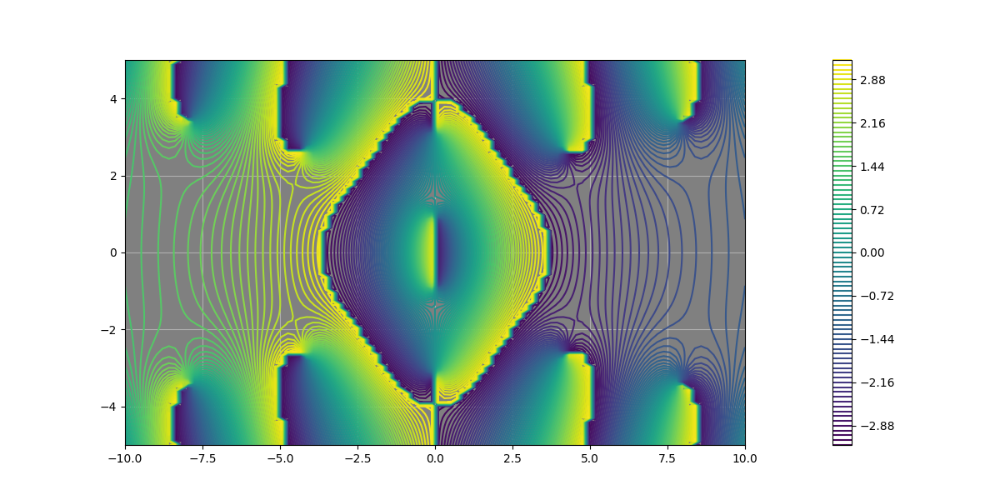

In [16]:
plotlogf(lambda Z:  M1M2(Z) / (product(Z)*M1(Z)**2), -10, 10, -5, 5,
         iref=100, rref=100, levels=100, log_off=True, phase=True)

# Doing algebra and comparing

It's fairly simple to do some algebra on the paper method. Because we have a symmetric geometry, detM=1 and M21 and M12 are pure imaginary and conjugate.  Thus b = +- 1 and we calculate that

|C|^2 = M22 / (-M21 +- 1)

How does this compare to our function coeffs?

In [19]:
def coeffs_algebraic(Z, sign='1'):
    M1 = A.transmission_matrix_Z(Z)
    return M1[..., 1, 1] / (-M1[..., 1, 0] + int(sign))

def product_algebraic(Z):
    M1 = A.transmission_matrix_Z(Z)
    return np.abs(M1[..., 1, 1])**2 / (np.abs(M1[..., 1, 0]**2) - 1)

Check if algebraic is same as paper

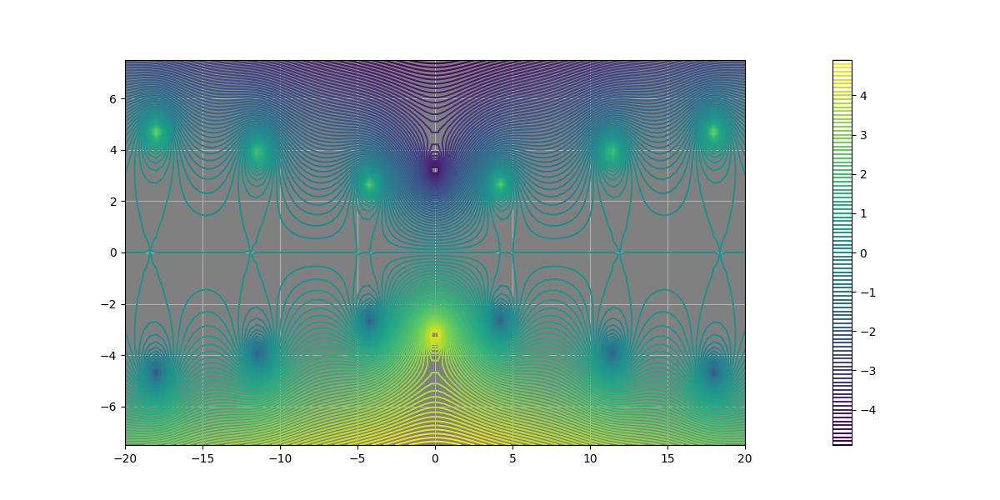

In [20]:
plotlogf(coeffs_paper, -20, 20, -7.5, 7.5,
        iref=100, rref=100, levels=100)

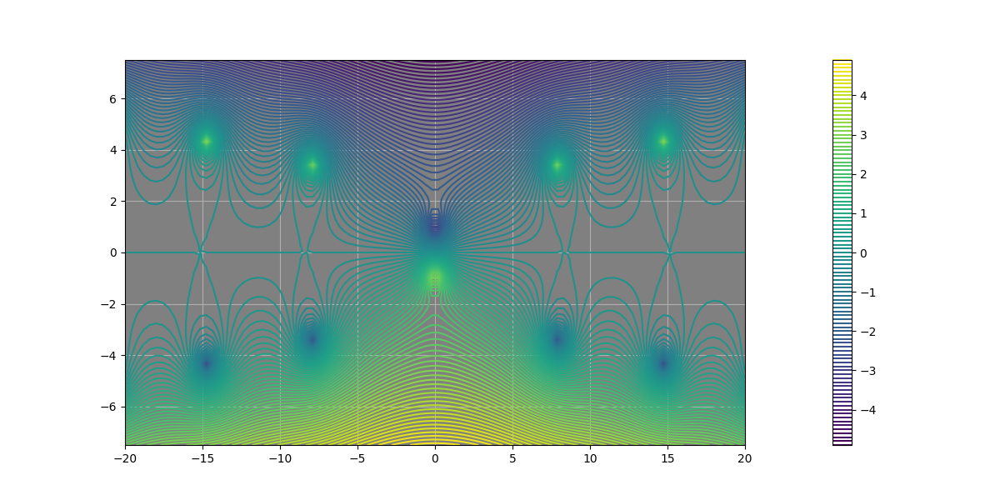

In [21]:
plotlogf(coeffs_algebraic, -20, 20, -7.5, 7.5, '-1',
        iref=100, rref=100, levels=100)

Seems to be, check now product

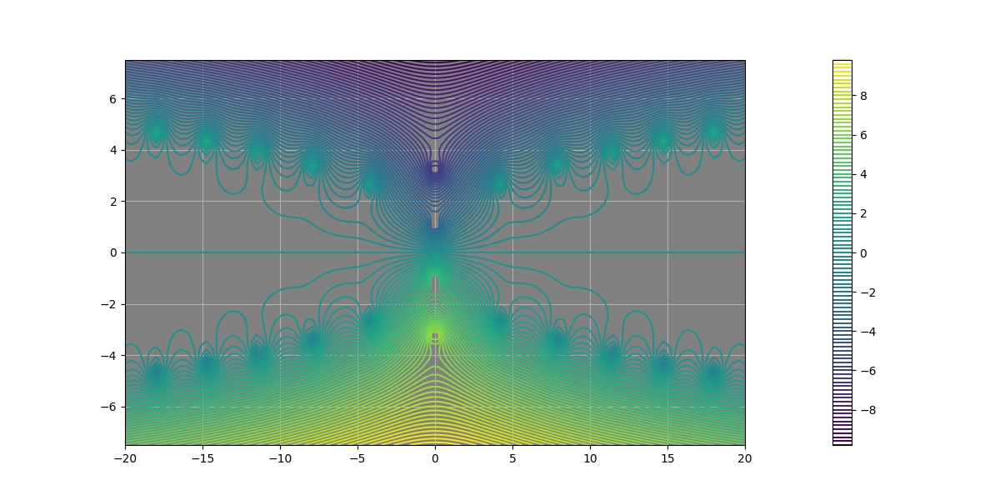

In [22]:
plotlogf(product, -20, 20, -7.5, 7.5, 
        iref=100, rref=100, levels=100)

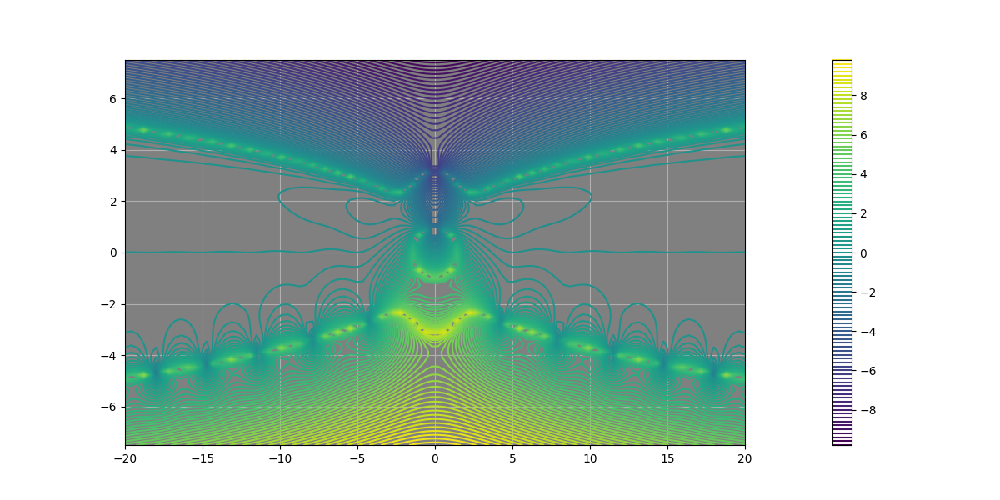

In [24]:
plotlogf(product_algebraic, -20, 20, -7.5, 7.5, 
        iref=100, rref=100, levels=100)

Numerically

In [32]:
coeffs_algebraic(1), coeffs_paper(2+1j)

((-0.6976323501916023-0.7164559330245943j), 0.5966667674414589)

In [71]:
product(Zs) - product_algebraic(Zs)

array([[2.22430778e+05-1.33306397e+05j, 2.76615991e+05-1.03346978e+05j,
        3.18673822e+05-5.65429000e+04j, ...,
        3.18673822e+05+5.65429000e+04j, 2.76615991e+05+1.03346978e+05j,
        2.22430778e+05+1.33306397e+05j],
       [1.58238663e+05-9.03567162e+04j, 1.95108431e+05-6.82335416e+04j,
        2.23119950e+05-3.47352803e+04j, ...,
        2.23119950e+05+3.47352803e+04j, 1.95108431e+05+6.82335416e+04j,
        1.58238663e+05+9.03567162e+04j],
       [1.12477732e+05-6.10590559e+04j, 1.37505154e+05-4.47873809e+04j,
        1.56080366e+05-2.08571276e+04j, ...,
        1.56080366e+05+2.08571276e+04j, 1.37505154e+05+4.47873809e+04j,
        1.12477732e+05+6.10590559e+04j],
       ...,
       [2.12158821e-05-1.15171395e-05j, 2.37771768e-05-7.74456407e-06j,
        2.47364881e-05-3.30555407e-06j, ...,
        2.47364881e-05+3.30555407e-06j, 2.37771768e-05+7.74456407e-06j,
        2.12158821e-05+1.15171395e-05j],
       [1.43754666e-05-8.20861304e-06j, 1.62765463e-05-5.69225222e-0

The products aren't the same, so I have an issue